In [1]:
#change this path to location of CellQuant folder
%cd /Users/guillaumeharmange/Documents/GitHub/CellQuant 
import glob
import CellQuant
import os
import tifffile
#change this path to location of StitchWell folder
%cd /Users/guillaumeharmange/Documents/GitHub/StitchWell 
from stitchwell import StitchWell
import numpy as np
import pandas as pd
from shutil import copyfile
from PIL import Image
from cellori import Cellori
import matplotlib.pyplot as plt
import cv2

/Users/guillaumeharmange/Documents/GitHub/CellQuant
/Users/guillaumeharmange/Documents/GitHub/StitchWell


In [35]:
#stitch well using Stitch well from shaffer lab github

PATHS=glob.glob('/Volumes/GoogleDrive/My Drive/Guillaume_Shared/ModulatingPrimedCells/RawData/Microscopy/20200317_ITGA3_NT5E_EGFR+NGFR/Replicate1')
overlap = None
stitchChannel = 1

for path in PATHS:
    outDir = str(path + '/Stitch_tif')
    os.mkdir(outDir)
    StitchWell(path).saveTIFF(outDir,overlap,stitchChannel)

Total Progess:   0%|          | 0/8 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

Image Progress:   0%|          | 0/625 [00:00<?, ?it/s]

In [53]:
#get XY coordinates from a sitched tiff using Cellori

PATHS=glob.glob('/Volumes/GoogleDrive/.shortcut-targets-by-id/1xLNFyyi5K6tukAzMGi5vcrf74N9QYMz4/Guillaume_Shared/ModulatingPrimedCells/RawData/Microscopy/20211112_Day3Scan_10x/**/Stitch_tif/*.tif')

#block of pixels used for adaptive background thresholding
threshold_locality = 1
sigma = 3
#max nucleus size
size=8

for path in PATHS:
    _,coords=Cellori(path).segment(threshold_locality=threshold_locality,sigma=sigma,nuclei_diameter=size,coordinate_format='xy')
    dat = pd.DataFrame(coords, columns = ['X','Y'])
    outpath =  path.split('.tif')[0]
    outpath = str(outpath+'_Cellxy.csv')
    dat.to_csv(outpath,index=False)

In [ ]:
#get nuclear masks from a sitched tiff using Cellori

PATHS=glob.glob('/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x.tif')

img = tifffile.imread('/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x.tif')
img2=img[0,:,:]

sigma = 4
#block of pixels used for adaptive background thresholding
block = 25
#max nucleus size
size=6
for path in PATHS:
    coords=Cellori(img2).segment(sigma=sigma,block_size=block,nuclei_diameter=size,segmentation_mode='masks',coordinate_format='xy')
    dat = pd.DataFrame(coords, columns = ['X','Y'])
    outpath =  path.split('.tif')[0]
    outpath = str(outpath+'_Cellxy.csv')
    dat.to_csv(outpath,index=False)

In [45]:
#downsize scans if needed for DeepCell Processing

TIFS = glob.glob('/Volumes/gharmHD1/20211103_FOXO_mClover/Stitch_tif/test/*.tif',recursive=True)

for tif in TIFS:
    img = tifffile.imread(tif)
    img = img[:,0:2000,0:2Harmange000]
    spltpath = tif.split('test')
    outdir = str(spltpath[0]+'test/DownSized')
    if not os.path.exists(outdir):
        os.mkdir(outdir)
    outpath = str(outdir+spltpath[1])
    tifffile.imwrite(outpath,img)

In [20]:
#get All XY coordinates from DeepCell Masks
PATHS = glob.glob('/Volumes/gharmHD1/20210817_DensityRep4/**/Stitch_tif/DownSized/*_nuc_mask.tif')

for path in PATHS:
    CellQuant.NucPos(path)

/Users/guillaumeharmange/opt/anaconda3/lib/python3.8/site-packages/PIL/Image.py:2855: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


In [ ]:
#Check that the radius used covers a resonable area to capture local density
CellQuant.TestRad('/Volumes/gharmBU2/210731_DensityRep1/2.5k/Tiff/Scan001_Cellxy.csv',50,'10x')

In [10]:
#Calculate densities for each condition
PATHS = glob.glob('/Volumes/gharmHD1/20211020_DrugDoseRep3/**/Stitch_tif/**/',recursive=True)
for path in PATHS:
    CellQuant.DensityQuant(path,50,'10x')

Density functions assumes images are from the Shaffer Lab Scope with 2x2 binning, if not using this scope edit the RESOLUTIONS dictionary in this funtion with the correct um/pixel values for each objective
Density functions assumes images are from the Shaffer Lab Scope with 2x2 binning, if not using this scope edit the RESOLUTIONS dictionary in this funtion with the correct um/pixel values for each objective
Density functions assumes images are from the Shaffer Lab Scope with 2x2 binning, if not using this scope edit the RESOLUTIONS dictionary in this funtion with the correct um/pixel values for each objective
Density functions assumes images are from the Shaffer Lab Scope with 2x2 binning, if not using this scope edit the RESOLUTIONS dictionary in this funtion with the correct um/pixel values for each objective
Density functions assumes images are from the Shaffer Lab Scope with 2x2 binning, if not using this scope edit the RESOLUTIONS dictionary in this funtion with the correct um/pi

In [ ]:
# check that the radius used does a good job capturing density
FILES = glob.glob('/Volumes/GoogleDrive/My Drive/Shaffer_Lab/LabNotebooks/Guillaume/SingleCellTranscripme&lineage/MicroscopeData/20210616_scopeCopy/Guillaume/20211008_Scan_drugDose/TGFBRi/Stitch_tif/*_SingleCellDensity.csv',recursive=True)
for file in FILES:
    CellQuant.PlotDensity(file)

In [ ]:
##get intensities within a mask
#raw image tif file
Image_path = '/Volumes/gharmHD1/WM989_mousePDX_mailer2/Stitch_tif/DownSized/NDplate4postScan027cy3023_60x.tif'
#maks tif file
Mask_path = '/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x.tif'
#which chanels you want to quanitfy in the mask
Channels = [2,3,4,5]

#Run maskQuant
data=CellQuant.MaskQuant(Image_path,Mask_path,Channels)

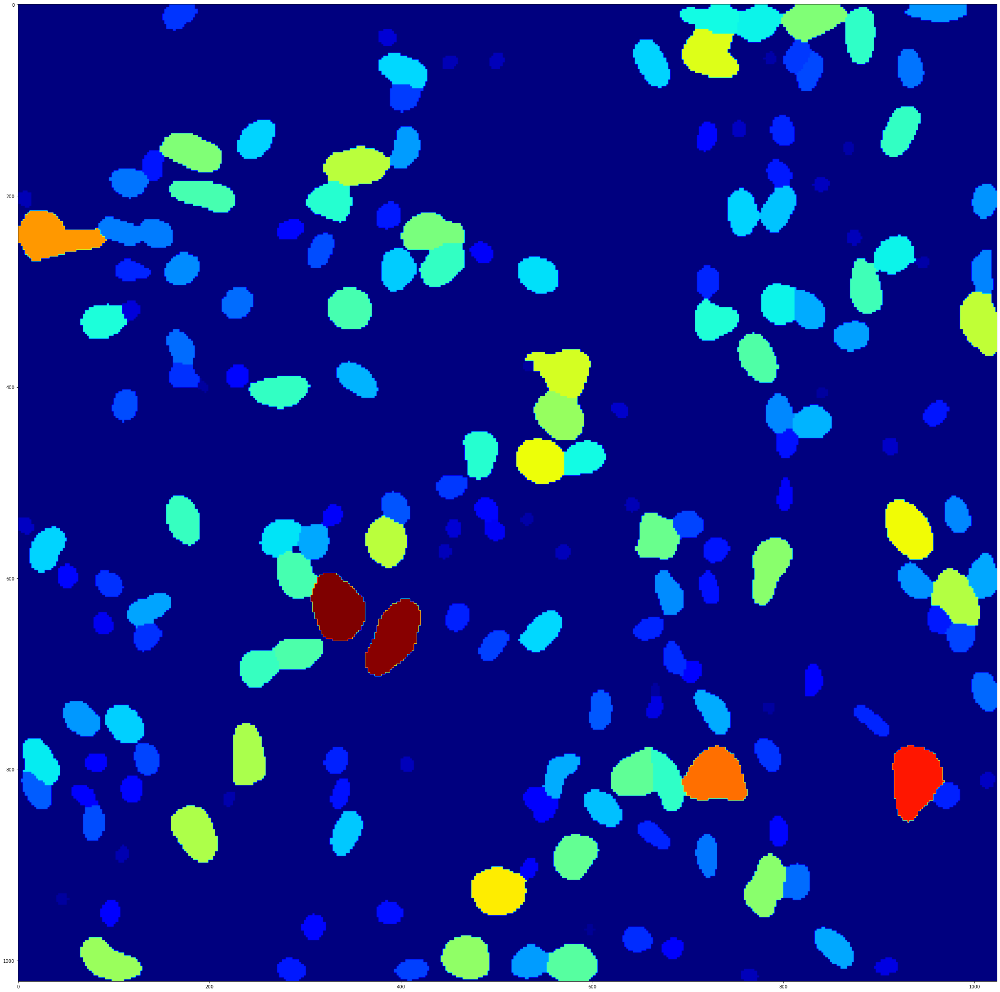

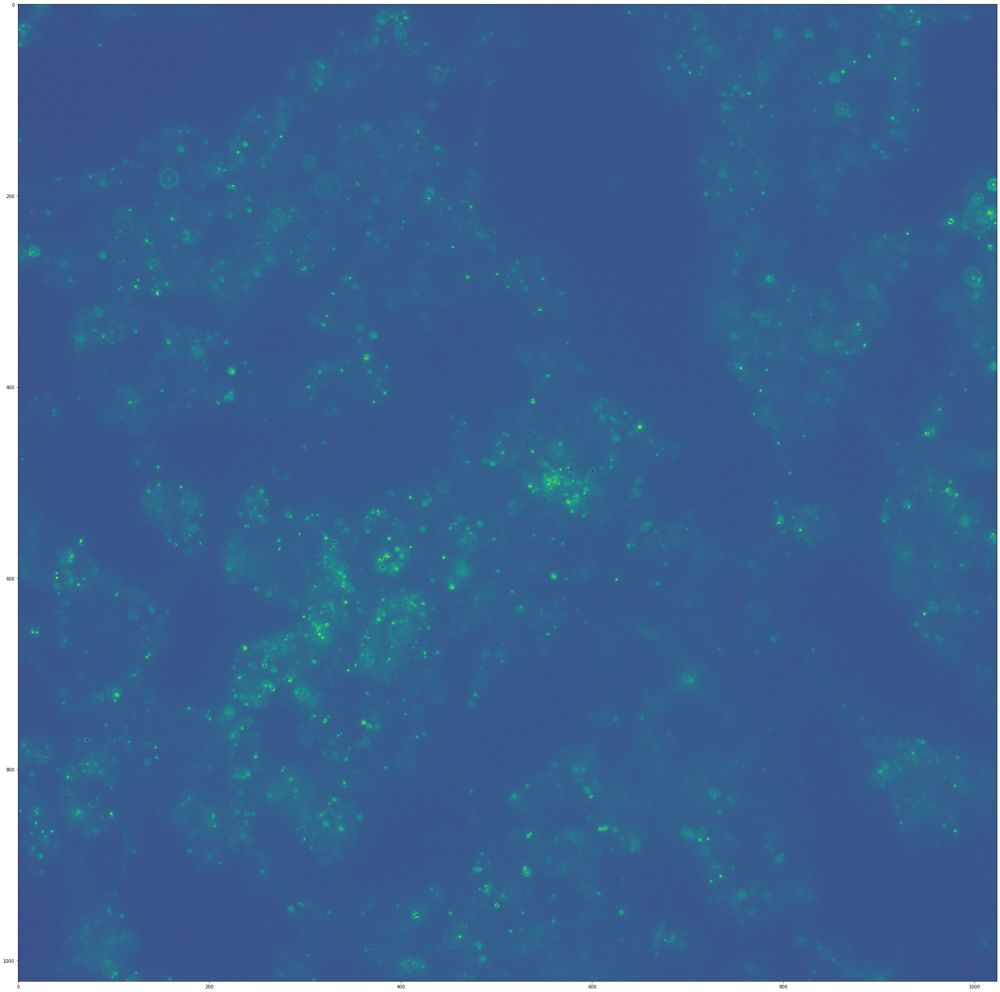

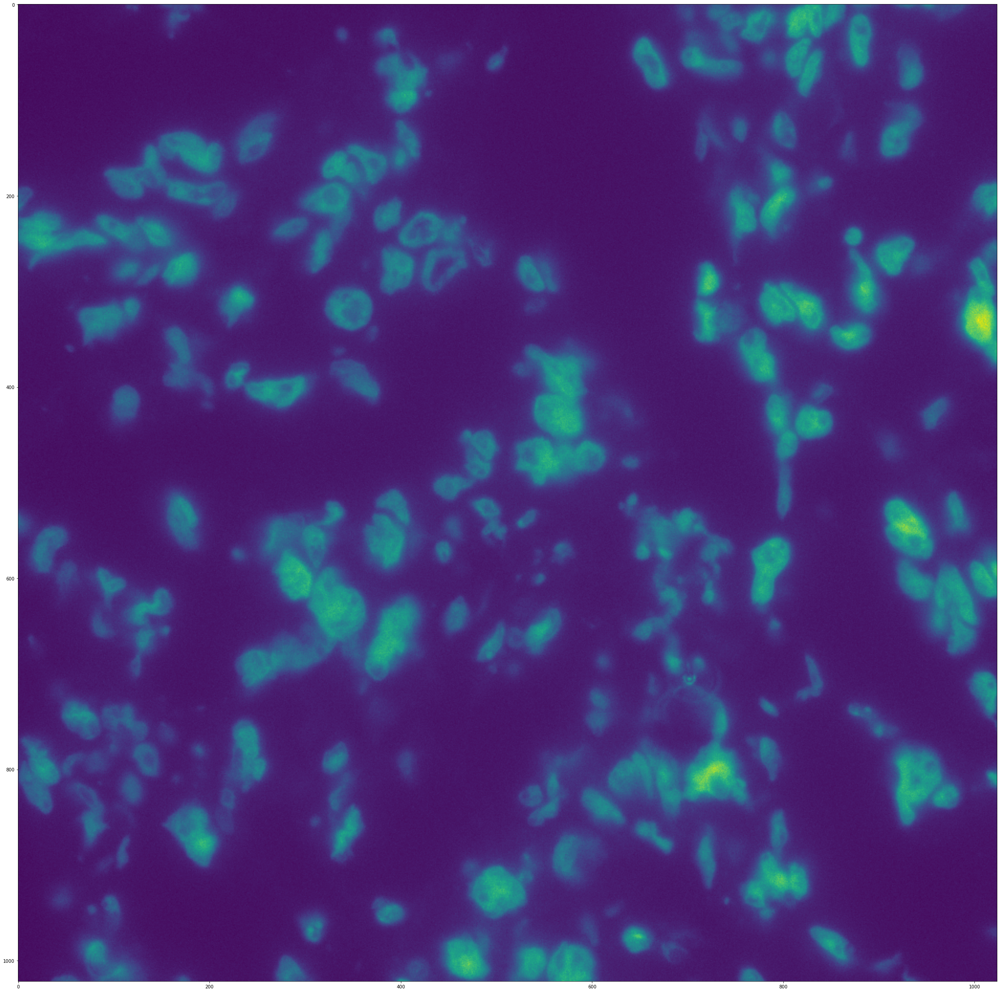

In [49]:
%matplotlib inline
## change mask number to be in order of intensity to verify intensity calls are correct 
#(basically check that red masks are assigned to high cells and blue is assigned to low cells)

#enter paths
QuantPath = '/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x_nuc_quant.csv'
MaskPath = '/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x_nuc_mask.tif'
rawim = tifffile.imread('/Volumes/gharmHD1/WM989_mousePDX_mailer2/NDplate4postScan027cy3024_60x.tif')
#enter channel you want to check
channel = 4

#load and reshape intensities based on Quant
intensity = np.genfromtxt(QuantPath, delimiter=',', skip_header= 1)[:,channel]
intensity = intensity.reshape((len(intensity),1))

#load masks and get unique masks
masks = tifffile.imread(MaskPath)
umasks = np.unique(masks)[1:]
umasks = umasks.reshape((len(umasks),1))

#create data frame with mask and their respective cell intensity and order by intensity
cytoquant = np.hstack((umasks,intensity))
sort_cytoquant = pd.DataFrame(cytoquant, columns = ['umask','Int'])
sort_cytoquant = sort_cytoquant.sort_values(by=['Int'])

#make new image with pixels all at 0
modmask = masks.copy()
modmask[modmask >= 0] = 0

#fill in new mask in order of real cell intensity
sort_cytoquant = np.array(sort_cytoquant)

for i in range(len(sort_cytoquant)):
    
    cint = sort_cytoquant[i,1]
    
    modmask[masks == sort_cytoquant[i,0]] = cint
    
plt.subplots(1, figsize=(40, 40))
plt.imshow(modmask[0, ..., 0], cmap='jet')
plt.show()

plt.subplots(1, figsize=(40, 40))
plt.imshow(rawim[channel,...]*20)
plt.show()

plt.subplots(1, figsize=(40, 40))
plt.imshow(rawim[0,...])
plt.show()

In [5]:
#Raw image in Tif format
ImagePath = '/Volumes/gharmHD1/20211103_FOXO_mClover/Stitch_tif/test/DownSized/20211103_125959_945__Plate000_Well07_ChannelA594,GFP_Seq0003.tif'
#Mask in Tif format
MaskPath = '/Volumes/gharmHD1/20211103_FOXO_mClover/Stitch_tif/test/DownSized/cyto_mask.tif'
#Channel of raw image mask is trying to capture (default is 1)
Channel = 2
#number to set brightness of raw image in output image (default = .15)
brightness = .15

#Run MaskCheck
CellQuant.MaskCheck(img_path=ImagePath,mask_path=MaskPath,channel=Channel,min_brightness=brightness)